# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [2]:
import glob
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import tensorflow as tf
%matplotlib inline

In [ ]:
#! pip install seaborn

In [ ]:
import seaborn as sns

In [ ]:
from utils import get_dataset

In [ ]:
import os
os.getcwd()

'/home/workspace'

In [ ]:
os.listdir("./home/workspace/data/*.tfrecord")

['test', 'train', 'val']

In [ ]:
dataset = get_dataset("/home/workspace/data/train/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86


## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [ ]:
def display_images(tfrecord):
    
    '''This function shows an image from the tfrecord with its
       corresponding ground truth bounding boxes and labels.
    '''
    # Variables
    name    = tfrecord['filename']
    img     = tfrecord['image'].numpy()
    img_shape = img.shape
    bboxes   = tfrecord['groundtruth_boxes'].numpy()
    classes = tfrecord['groundtruth_classes'].numpy()

    #Display the information of the tfrecord
    print('Name of the TFrecord: {}'.format(tfrecord['filename']))
    print('shape : {}'.format(img_shape))
    print('Image contains {} boxes:'.format(len(bboxes)))
    print('Image contains{} :'.format(len(classes)))

    _, ax = plt.subplots(1,figsize=(20, 10))
    # color mapping of classes
    colormap = {1: [1, 0, 0], 2: [0, 0, 1], 4: [0, 1, 0]}

    for cl, bb in zip(classes, bboxes):
        y1, x1, y2, x2 = bb
        y1 = y1*img_shape[0]
        x1 = x1*img_shape[1]
        y2 = y2*img_shape[0]
        x2 = x2*img_shape[1]
        rec = Rectangle((x1, y1), x2- x1, y2-y1, facecolor='none', edgecolor=colormap[cl])
        ax.add_patch(rec)

    # Plot the image with its corresponding bounding boxes
    imgplot = plt.imshow(img)
    plt.show()



Name of the TFrecord: b'segment-1051897962568538022_238_170_258_170_with_camera_labels_180.tfrecord'
shape : (640, 640, 3)
Image contains 13 boxes:
Image contains13 :


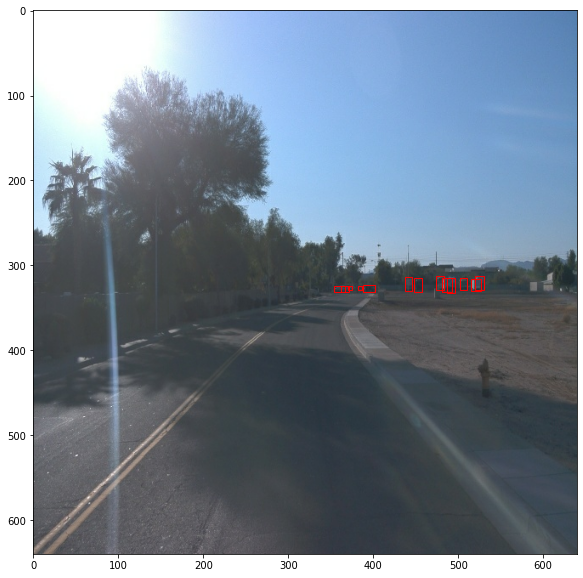

Name of the TFrecord: b'segment-11139647661584646830_5470_000_5490_000_with_camera_labels_40.tfrecord'
shape : (640, 640, 3)
Image contains 3 boxes:
Image contains3 :


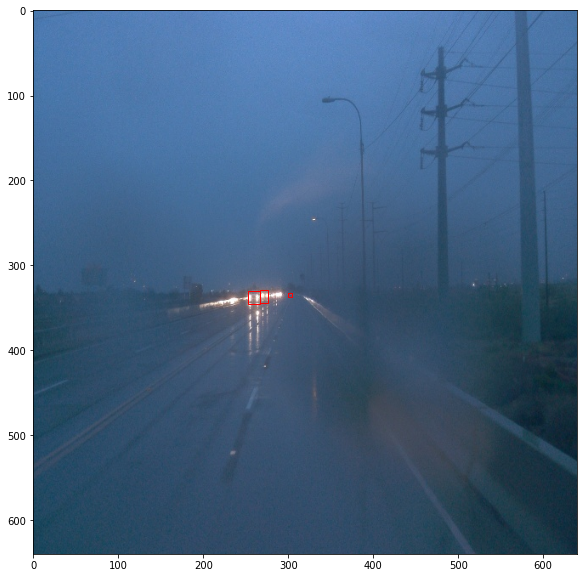

Name of the TFrecord: b'segment-10072140764565668044_4060_000_4080_000_with_camera_labels_110.tfrecord'
shape : (640, 640, 3)
Image contains 65 boxes:
Image contains65 :


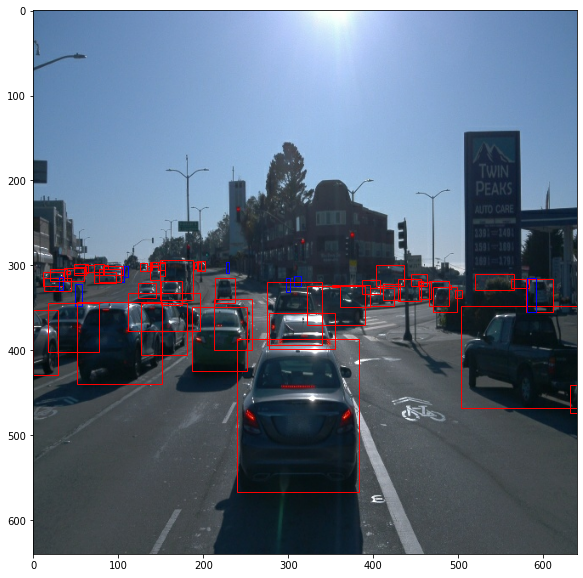

Name of the TFrecord: b'segment-1146261869236413282_1680_000_1700_000_with_camera_labels_40.tfrecord'
shape : (640, 640, 3)
Image contains 32 boxes:
Image contains32 :


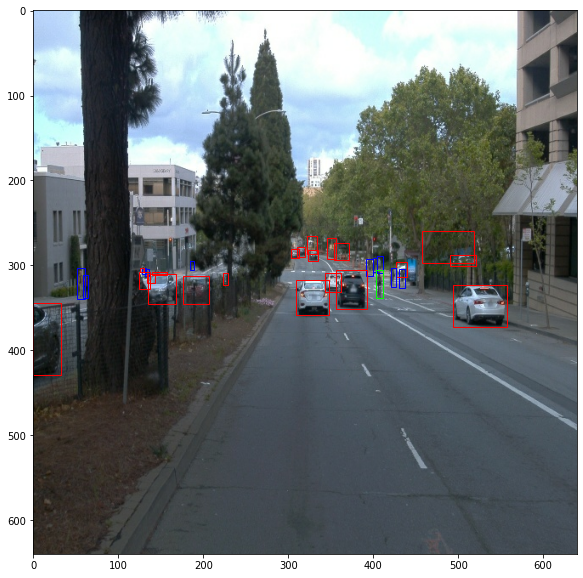

Name of the TFrecord: b'segment-11392401368700458296_1086_429_1106_429_with_camera_labels_100.tfrecord'
shape : (640, 640, 3)
Image contains 35 boxes:
Image contains35 :


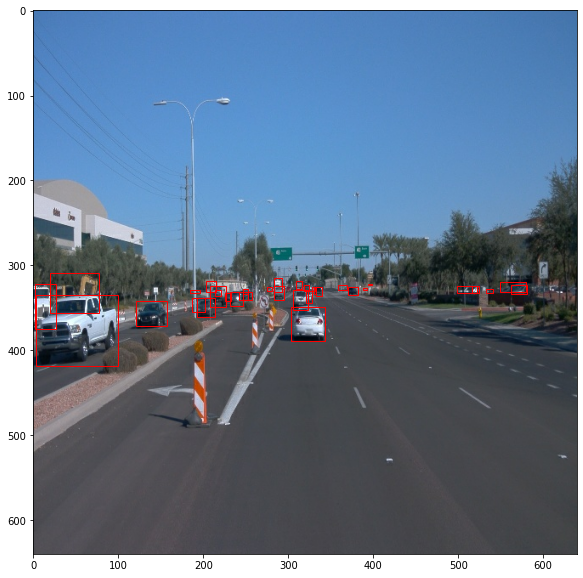

Name of the TFrecord: b'segment-10023947602400723454_1120_000_1140_000_with_camera_labels_140.tfrecord'
shape : (640, 640, 3)
Image contains 48 boxes:
Image contains48 :


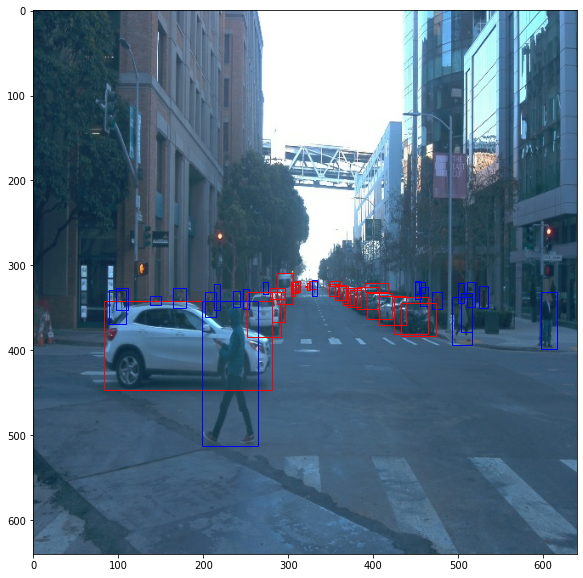

Name of the TFrecord: b'segment-10226164909075980558_180_000_200_000_with_camera_labels_60.tfrecord'
shape : (640, 640, 3)
Image contains 29 boxes:
Image contains29 :


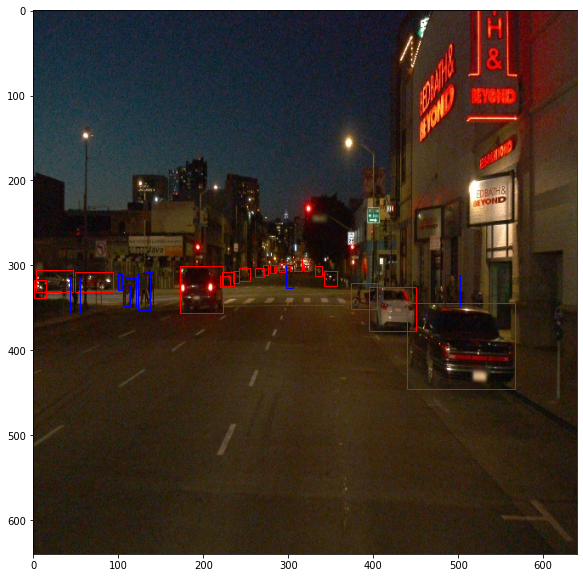

Name of the TFrecord: b'segment-11119453952284076633_1369_940_1389_940_with_camera_labels_90.tfrecord'
shape : (640, 640, 3)
Image contains 8 boxes:
Image contains8 :


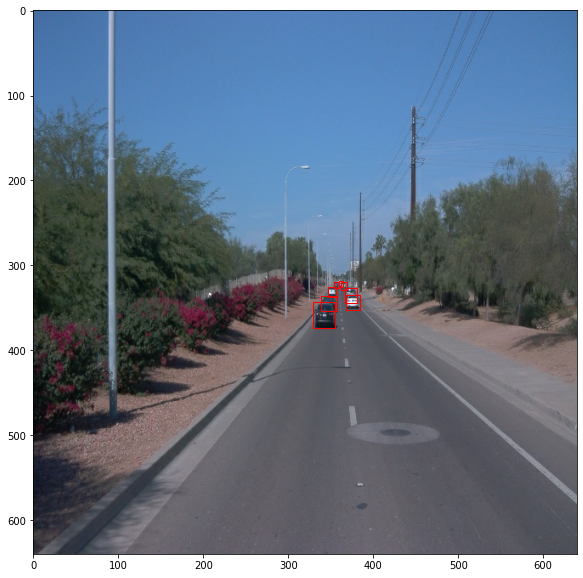

Name of the TFrecord: b'segment-10096619443888687526_2820_000_2840_000_with_camera_labels_100.tfrecord'
shape : (640, 640, 3)
Image contains 4 boxes:
Image contains4 :


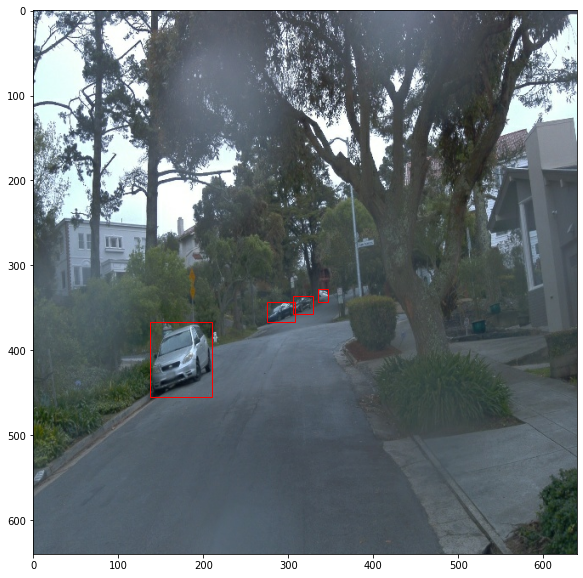

Name of the TFrecord: b'segment-11139647661584646830_5470_000_5490_000_with_camera_labels_20.tfrecord'
shape : (640, 640, 3)
Image contains 2 boxes:
Image contains2 :


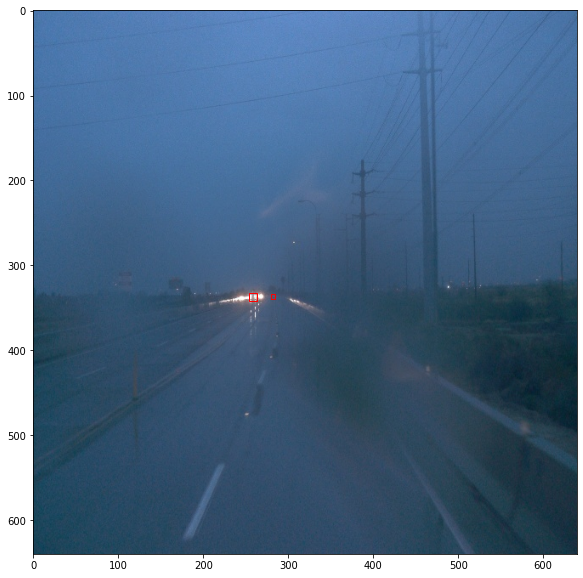

In [ ]:
# Displaying images
dataset.shuffle(100)

for batches in dataset.take(10):
    display_images(batches)

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

Name of the TFrecord: b'segment-10391312872392849784_4099_400_4119_400_with_camera_labels_40.tfrecord'
shape : (640, 640, 3)
Image contains 12 boxes:
Image contains12 :


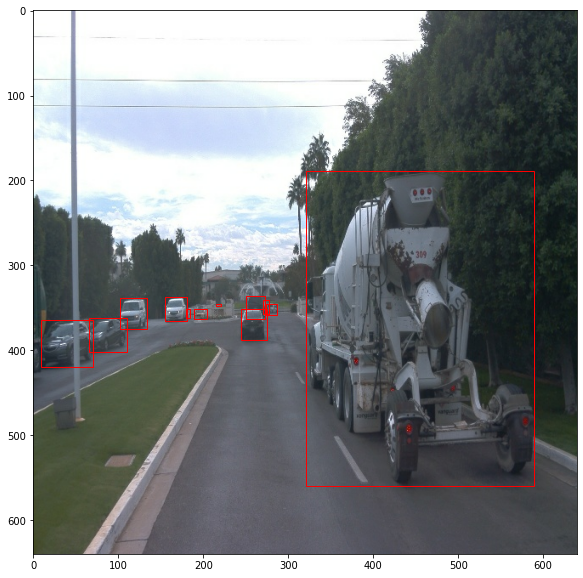

Name of the TFrecord: b'segment-10023947602400723454_1120_000_1140_000_with_camera_labels_50.tfrecord'
shape : (640, 640, 3)
Image contains 16 boxes:
Image contains16 :


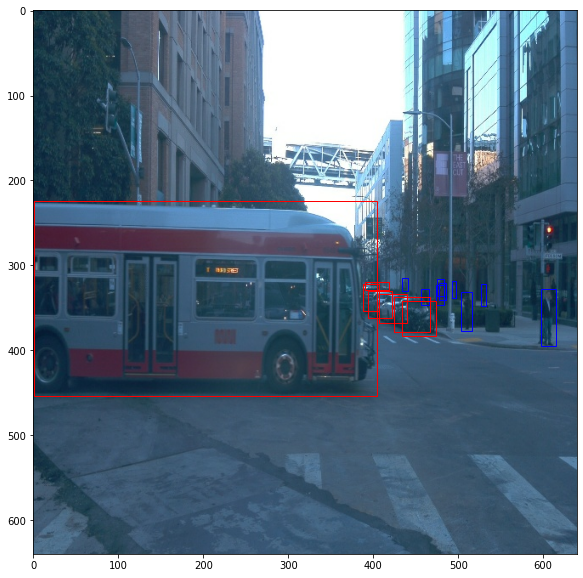

Name of the TFrecord: b'segment-10625026498155904401_200_000_220_000_with_camera_labels_0.tfrecord'
shape : (640, 640, 3)
Image contains 60 boxes:
Image contains60 :


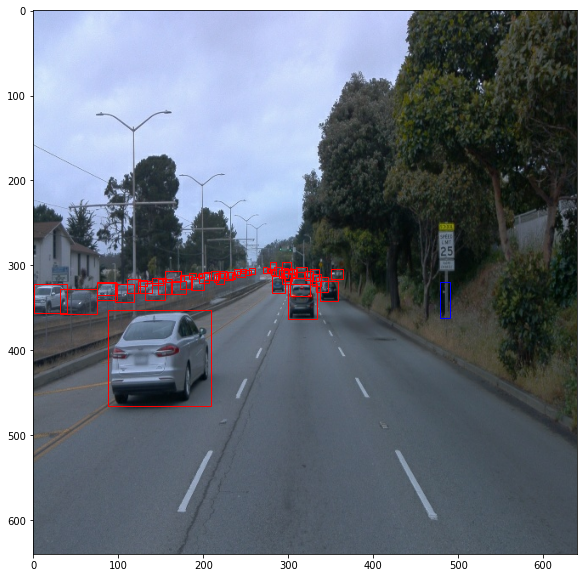

Name of the TFrecord: b'segment-10750135302241325253_180_000_200_000_with_camera_labels_10.tfrecord'
shape : (640, 640, 3)
Image contains 17 boxes:
Image contains17 :


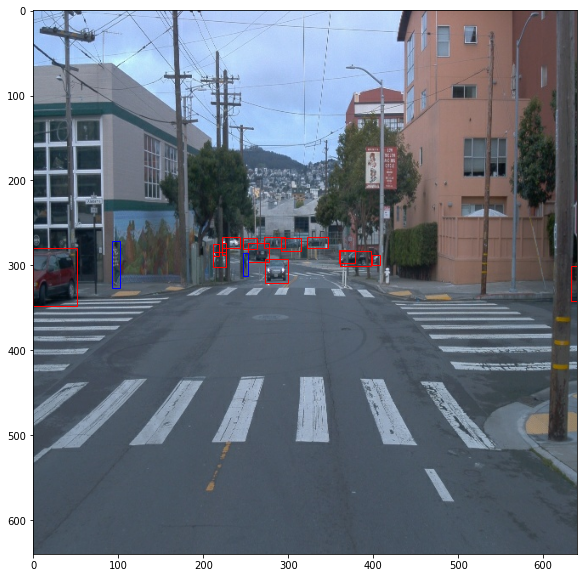

Name of the TFrecord: b'segment-11252086830380107152_1540_000_1560_000_with_camera_labels_70.tfrecord'
shape : (640, 640, 3)
Image contains 32 boxes:
Image contains32 :


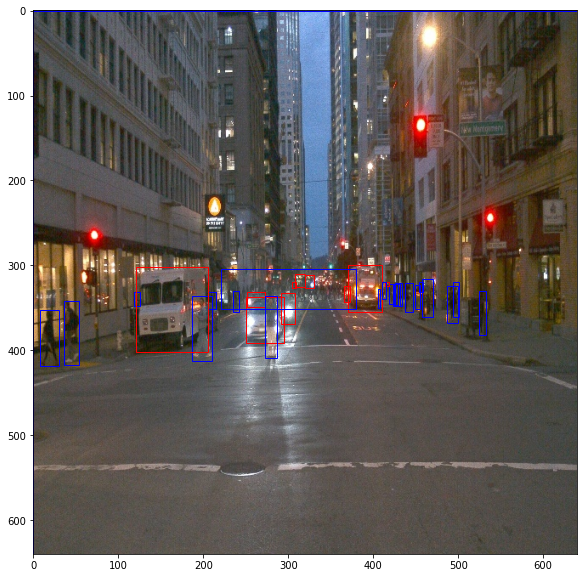

Name of the TFrecord: b'segment-11126313430116606120_1439_990_1459_990_with_camera_labels_50.tfrecord'
shape : (640, 640, 3)
Image contains 9 boxes:
Image contains9 :


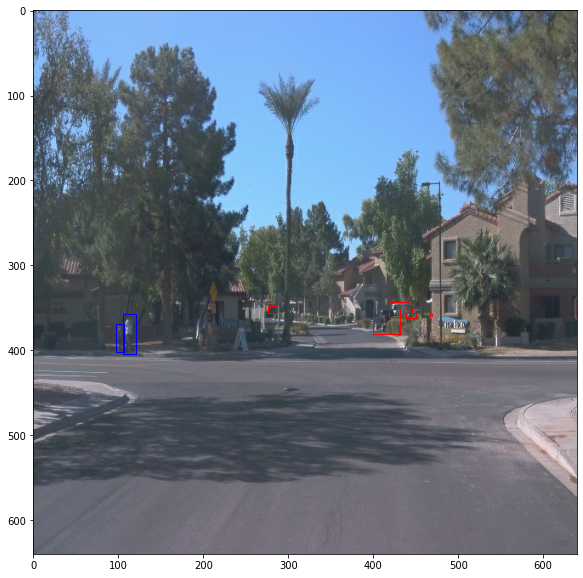

Name of the TFrecord: b'segment-1083056852838271990_4080_000_4100_000_with_camera_labels_180.tfrecord'
shape : (640, 640, 3)
Image contains 11 boxes:
Image contains11 :


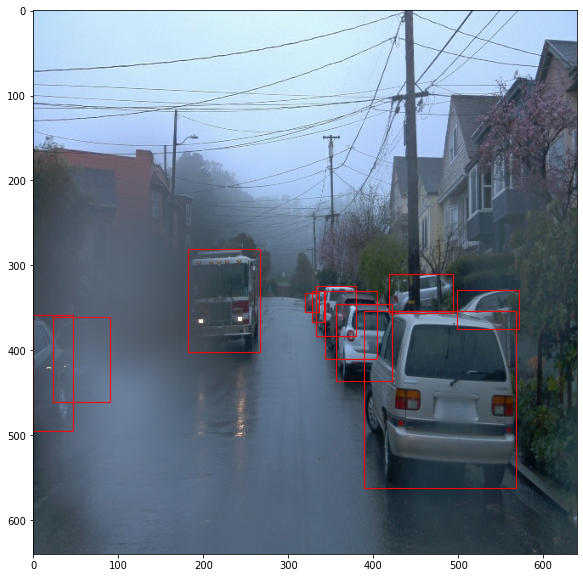

Name of the TFrecord: b'segment-10963653239323173269_1924_000_1944_000_with_camera_labels_40.tfrecord'
shape : (640, 640, 3)
Image contains 30 boxes:
Image contains30 :


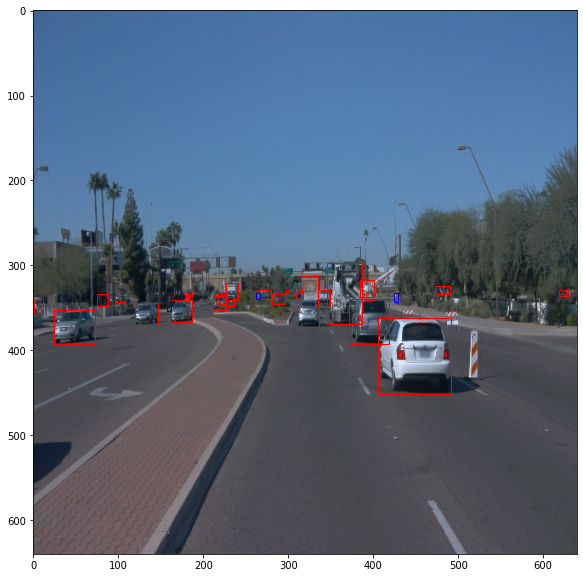

Name of the TFrecord: b'segment-11486225968269855324_92_000_112_000_with_camera_labels_190.tfrecord'
shape : (640, 640, 3)
Image contains 5 boxes:
Image contains5 :


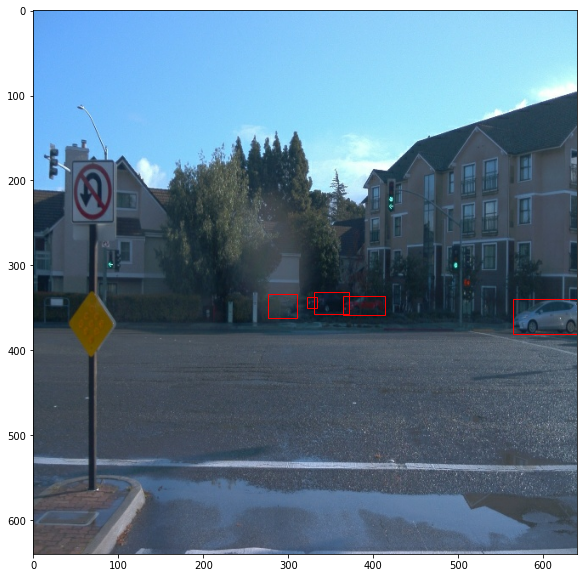

Name of the TFrecord: b'segment-11454085070345530663_1905_000_1925_000_with_camera_labels_140.tfrecord'
shape : (640, 640, 3)
Image contains 6 boxes:
Image contains6 :


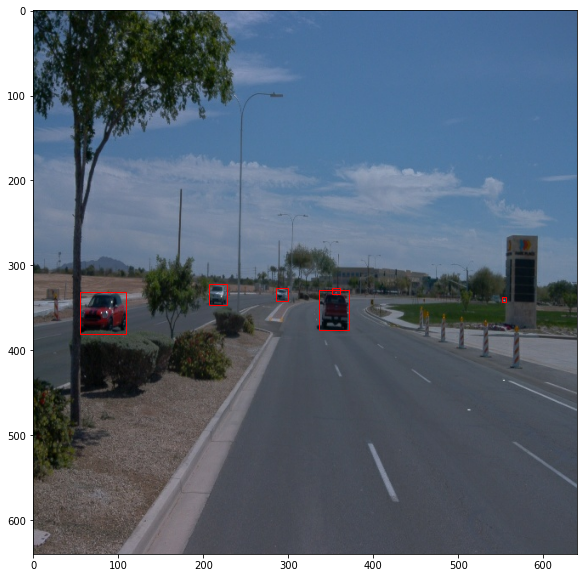

In [ ]:
# Display 10 random images in dataset

for batches in dataset.take(10):
    display_images(batches)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [ ]:
img_labels = {1:0,2:0,4:0}
label_distance = {1:[],2:[],4:[]}

for img_batch in dataset.take(15000):
    object_counts = {1:0,2:0,4:0}
    for l in img_batch["groundtruth_classes"].numpy():
        img_labels[l] +=1
        object_counts[l] +=1
        label_distance[l].append(object_counts[l])
        
        

In [ ]:
#show label test
img_labels

{1: 259444, 2: 72573, 4: 1854}

[Text(0.5, 0, 'classes'),
 Text(0, 0.5, 'object_count'),
 Text(0.5, 1.0, 'barplot of 3 classes for 15000 images')]

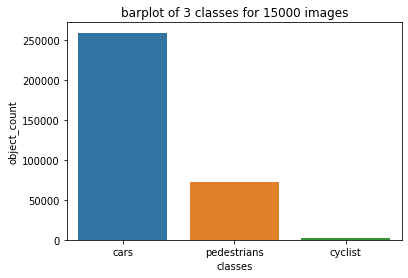

In [ ]:
label_map = {"cars":img_labels[1],"pedestrians":img_labels[2],"cyclist":img_labels[4]}
dict_keys=list(label_map.keys())

#convert label map to strings
v = [label_map[key]for key in dict_keys]
ax = sns.barplot(x=dict_keys,y=v)
ax.set(xlabel ="classes",ylabel= "object_count",title = "barplot of 3 classes for 15000 images")